In [308]:
import cv2
from skimage import img_as_float,exposure
import skimage.io as io
from skimage.color import rgb2gray,rgb2hsv,rgba2rgb
import matplotlib.pyplot as plt
import numpy as np
from skimage.util import random_noise
from skimage.morphology import thin
import numpy as np
from skimage.transform import downscale_local_mean,rescale
from scipy.ndimage import zoom,convolve
from sklearn.metrics import mean_squared_error
from skimage.exposure import histogram
from matplotlib.pyplot import bar
from skimage.filters import roberts, sobel, scharr, prewitt,gaussian,laplace,median,threshold_otsu,threshold_local


In [154]:
def show_images(images,titles=None):
    n_ims = len(images)
    if titles is None: titles = ['(%d)' % i for i in range(1,n_ims + 1)]
    fig = plt.figure()
    n = 1
    for image,title in zip(images,titles):
        a = fig.add_subplot(1,n_ims,n)
        if image.ndim == 2: 
            plt.gray()
        plt.imshow(image)
        a.set_title(title)
        n += 1
    fig.set_size_inches(np.array(fig.get_size_inches()) * n_ims)
    plt.show()

In [137]:
roberts_cross_x = np.array([[1, 0], [0, -1]])
roberts_cross_y = np.array([[0, 1], [-1, 0]])

def manual_roberts(image):
    edge_x = convolve(image, roberts_cross_x)
    edge_y = convolve(image, roberts_cross_y)
    edges = np.sqrt(edge_x**2 + edge_y**2)
    return edges

In [158]:
prewitt_kernel_x = np.array([[1, 0, -1], [1, 0, -1], [1, 0, -1]])
prewitt_kernel_y = np.array([[1, 1, 1], [0, 0, 0], [-1, -1, -1]])

def manual_prewitt(image):
    edge_x = convolve(image, prewitt_kernel_x)
    edge_y = convolve(image, prewitt_kernel_y)
    edges = np.sqrt(edge_x**2 + edge_y**2)
    return edges

In [160]:
sobel_kernel_x = np.array([[-1, 0, 1], [-2, 0, 2], [-1, 0, 1]])
sobel_kernel_y = np.array([[1, 2, 1], [0, 0, 0], [-1, -2, -1]])

def manual_sobel(image):
    edge_x = convolve(image, sobel_kernel_x)
    edge_y = convolve(image, sobel_kernel_y)
    edges = np.sqrt(edge_x**2 + edge_y**2)
    return edges

In [162]:
kernels_robinson = {
        'North': np.array([[1, 1, 1], [1, -2, 1], [-1, -1, -1]]),
        'South': np.array([[-1, -1, -1], [1, -2, 1], [1, 1, 1]]),
        'East': np.array([[-1, 1, 1], [-1, -2, 1], [-1, 1, 1]]),
        'West': np.array([[1, 1, -1], [1, -2, -1], [1, 1, -1]]),
        'Northeast': np.array([[1, 1, 1], [-1, -2, 1], [-1, -1, 1]]),
        'Northwest': np.array([[1, 1, 1], [1, -2, -1], [1, -1, -1]]),
        'Southeast': np.array([[-1, -1, 1], [-1, -2, 1], [1, 1, 1]]),
        'Southwest': np.array([[1, -1, -1], [1, -2, -1], [1, 1, 1]])
    }

def manual_robinson(image):
    edge_maps = {}
    for direction, kernel in kernels_robinson.items():
        edge_maps[direction] = convolve(image, kernel)

    edges = np.max([np.abs(edge_map) for edge_map in edge_maps.values()], axis=0)
    return edges

In [170]:
kernels_kirsch = {
        'North': np.array([[5, 5, 5], [-3, 0, -3], [-3, -3, -3]]),
        'West': np.array([[5, -3, -3], [5, 0, -3], [5, -3, -3]]),
        'South': np.array([[-3, -3, -3], [-3, 0, -3], [5, 5, 5]]),
        'East': np.array([[-3, -3, 5], [-3, 0, 5], [-3, -3, 5]]),
        'Northeast': np.array([[-3, 5, 5], [-3, 0, 5], [-3, -3, -3]]),
        'Northwest': np.array([[5, 5, -3], [5, 0, -3], [-3, -3, -3]]),
        'Southeast': np.array([[-3, -3, -3], [-3, 0, 5], [-3, 5, 5]]),
        'Southwest': np.array([[-3, -3, -3], [5, 0, -3], [5, 5, -3]])
    }

def manual_kirsch(image):
    edge_maps = {}
    for direction, kernel in kernels_kirsch.items():
        edge_maps[direction] = convolve(image, kernel)

    edges = np.max([np.abs(edge_map) for edge_map in edge_maps.values()], axis=0)
    return edges

<div style="
  background-color: #e3f2fd;
  padding: 15px;
  border-left: 6px solid #0d47a1;
  border-radius: 8px;
  font-family: 'Georgia', serif;
  color: #01579b;
  font-size: 28px;
  text-align: center;
  font-weight: bold;
">
Sampling
</div>


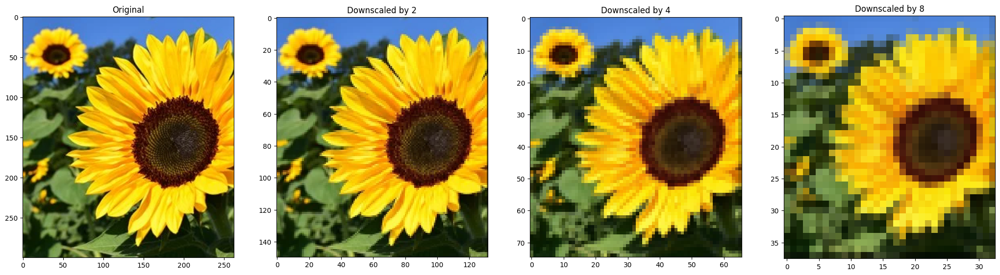

In [27]:
flower = io.imread('flower.png')
factors = [2,4,8]
imgs = [flower]
titles = ['Original']
for f in factors:
    flower_down_scale = downscale_local_mean(flower, (f, f,1)).astype(int)
    imgs.append(flower_down_scale)
    titles.append('Downscaled by %d' % f)
show_images(imgs,titles)

<div style="
  background-color: #e3f2fd;
  padding: 15px;
  border-left: 6px solid #0d47a1;
  border-radius: 8px;
  font-family: 'Georgia', serif;
  color: #01579b;
  font-size: 28px;
  text-align: center;
  font-weight: bold;
">
Quantizing
</div>


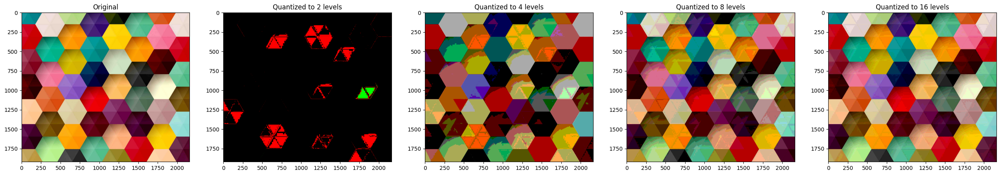

In [37]:
colorful = io.imread('colors.jpg')
factors = [2,4,8,16]
images= [colorful]
titles = ['Original']
for k in factors:
    bins = np.linspace(0, colorful.max(), k)
    image = np.digitize(colorful, bins)
    image = (np.vectorize(bins.tolist().__getitem__)
                         (image-1).astype(int))
    images.append(image)
    titles.append('Quantized to %d levels' % k)
show_images(images,titles)

<div style="
  background-color: #e3f2fd;
  padding: 15px;
  border-left: 6px solid #0d47a1;
  border-radius: 8px;
  font-family: 'Georgia', serif;
  color: #01579b;
  font-size: 28px;
  text-align: center;
  font-weight: bold;
">
Zooming
</div>


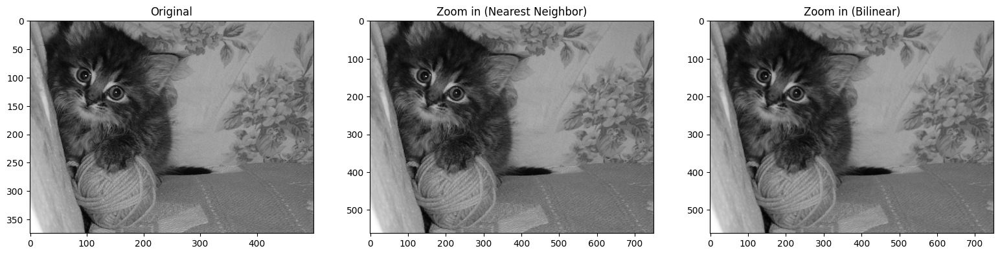

In [68]:
cat = io.imread('cat.jpg', as_gray=True)

zoom_in_nn = cv2.resize(cat, None, fx=1.5, fy=1.5, interpolation=cv2.INTER_NEAREST)
zoom_in_bilinear = cv2.resize(cat, None, fx=1.5, fy=1.5, interpolation=cv2.INTER_LINEAR)
show_images([cat,zoom_in_nn,zoom_in_bilinear],['Original','Zoom in (Nearest Neighbor)','Zoom in (Bilinear)'])

In [69]:
nn_resized = cv2.resize(zoom_in_nn, (cat.shape[1], cat.shape[0]), interpolation=cv2.INTER_NEAREST)
bilinear_resized = cv2.resize(zoom_in_bilinear, (cat.shape[1], cat.shape[0]), interpolation=cv2.INTER_LINEAR)

mse_nn = mean_squared_error(cat, nn_resized)
mse_bilinear = mean_squared_error(cat, bilinear_resized)

print(f"Mean Squared Error (NN Interpolation): {mse_nn}")
print(f"Mean Squared Error (Bilinear Interpolation): {mse_bilinear}")

Mean Squared Error (NN Interpolation): 0.0018591576115532527
Mean Squared Error (Bilinear Interpolation): 0.0001429304765926543


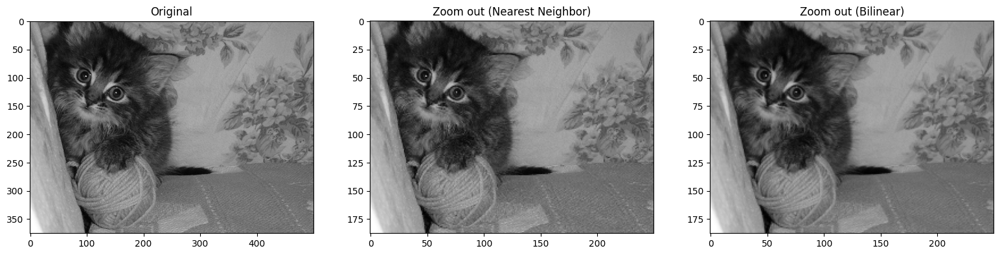

In [70]:
zoom_out_nn = cv2.resize(cat, None, fx=0.5, fy=0.5, interpolation=cv2.INTER_NEAREST)
zoom_out_bilinear = cv2.resize(cat, None, fx=0.5, fy=0.5, interpolation=cv2.INTER_LINEAR)
show_images([cat,zoom_out_nn,zoom_out_bilinear],['Original','Zoom out (Nearest Neighbor)','Zoom out (Bilinear)'])

In [71]:
nn_resized = cv2.resize(zoom_out_nn, (cat.shape[1], cat.shape[0]), interpolation=cv2.INTER_NEAREST)
bilinear_resized = cv2.resize(zoom_out_bilinear, (cat.shape[1], cat.shape[0]), interpolation=cv2.INTER_LINEAR)

mse_nn = mean_squared_error(cat, nn_resized)
mse_bilinear = mean_squared_error(cat, bilinear_resized)

print(f"Mean Squared Error (NN Interpolation): {mse_nn}")
print(f"Mean Squared Error (Bilinear Interpolation): {mse_bilinear}")

Mean Squared Error (NN Interpolation): 0.0012638362887561498
Mean Squared Error (Bilinear Interpolation): 0.0007114086239970681


<div style="
  background-color: #e3f2fd;
  padding: 15px;
  border-left: 6px solid #0d47a1;
  border-radius: 8px;
  font-family: 'Georgia', serif;
  color: #01579b;
  font-size: 28px;
  text-align: center;
  font-weight: bold;
">
Contrast Enhancement
</div>


In [310]:
low_contrast = io.imread('low_contrast2.jpg', as_gray=True)


In [311]:
c = 255/(np.log(1 + np.max(low_contrast))) 
log_transformed = c * np.log(1 + low_contrast) 
log_transformed = np.array(log_transformed, dtype = np.uint8) 

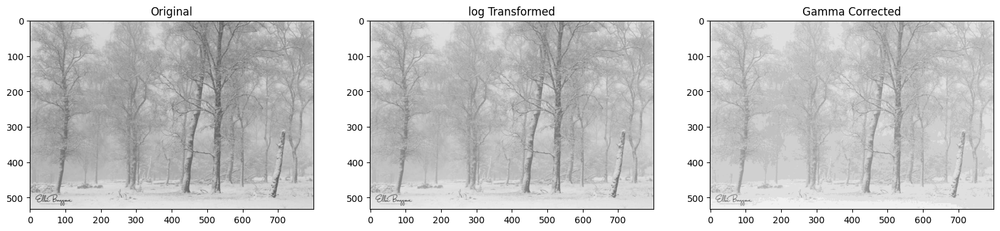

In [320]:
gamma_corrected = np.array(255*(low_contrast / 255) ** 0.4, dtype = 'uint8') 
show_images([low_contrast,log_transformed,gamma_corrected],['Original','log Transformed','Gamma Corrected'])

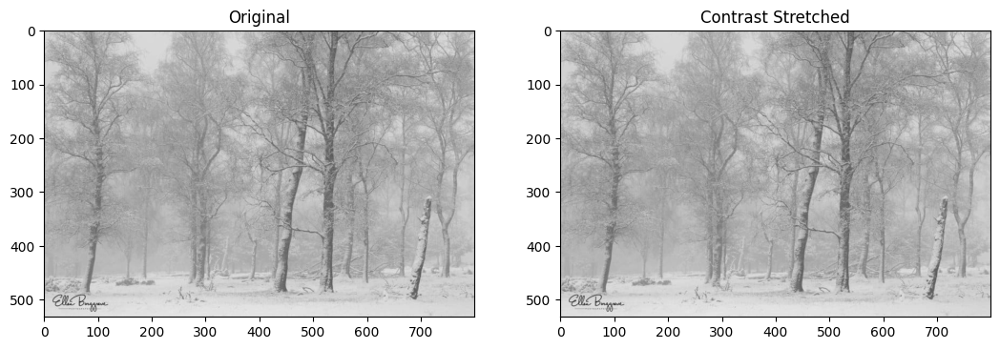

In [330]:
def pixelVal(pix, r1, s1, r2, s2): 
    if (0 <= pix and pix <= r1): 
        return (s1 / r1)*pix 
    elif (r1 < pix and pix <= r2): 
        return ((s2 - s1)/(r2 - r1)) * (pix - r1) + s1 
    else: 
        return ((255 - s2)/(255 - r2)) * (pix - r2) + s2 
  
# Define parameters. 
r1 = 70
s1 = 10
r2 = 140
s2 = 255
  
# Vectorize the function to apply it to each value in the Numpy array. 
pixelVal_vec = np.vectorize(pixelVal) 
  
# Apply contrast stretching. 
contrast_stretched = pixelVal_vec(low_contrast, r1, s1, r2, s2) 

show_images([low_contrast,contrast_stretched],['Original','Contrast Stretched'])
  

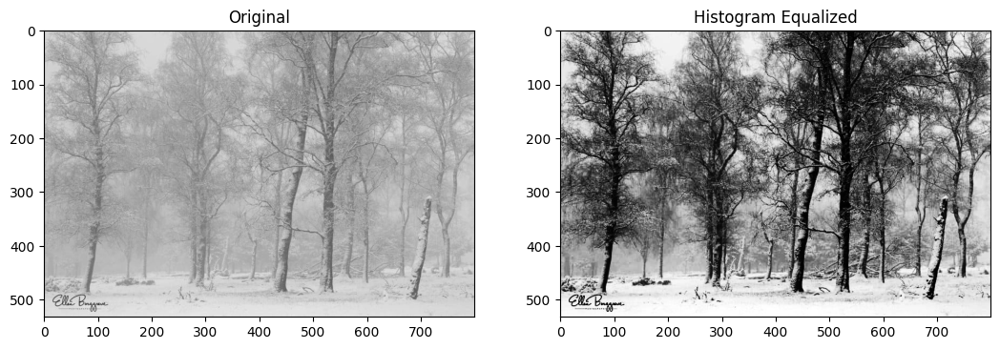

In [314]:
img_eq = exposure.equalize_hist(low_contrast)
show_images([low_contrast,img_eq],['Original','Histogram Equalized'])


<div style="
  background-color: #e3f2fd;
  padding: 15px;
  border-left: 6px solid #0d47a1;
  border-radius: 8px;
  font-family: 'Georgia', serif;
  color: #01579b;
  font-size: 28px;
  text-align: center;
  font-weight: bold;
">
Thresholding & Thinning
</div>

<BarContainer object of 256 artists>

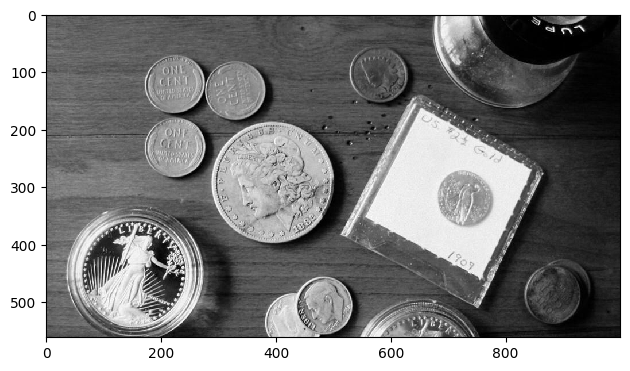

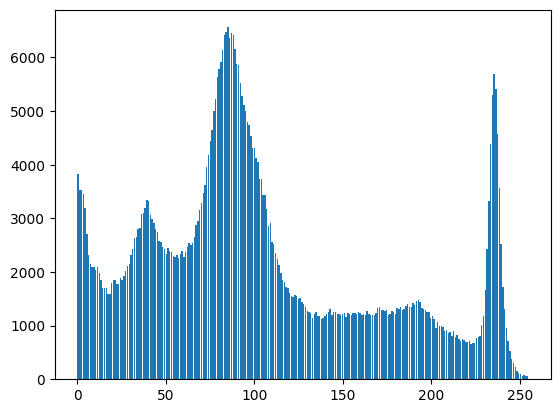

In [271]:
coins = io.imread('coins.jpg', as_gray=True)
io.imshow(coins)
histogramImg=histogram(coins,nbins=256)
plt.figure()
bar(histogramImg[1]*255, histogramImg[0],align='center')

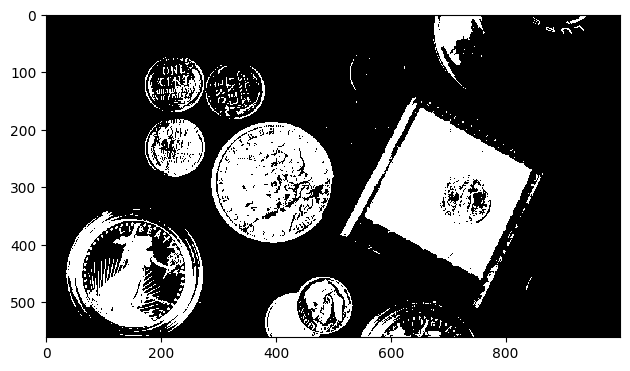

In [279]:
_, binary_img = cv2.threshold(coins, 0.6, 1, cv2.THRESH_BINARY)
io.imshow(binary_img)


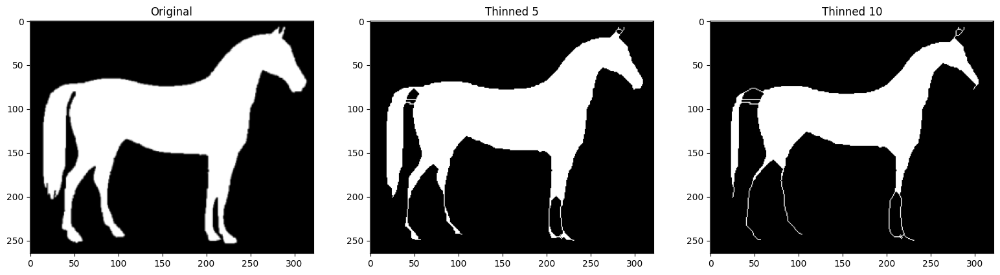

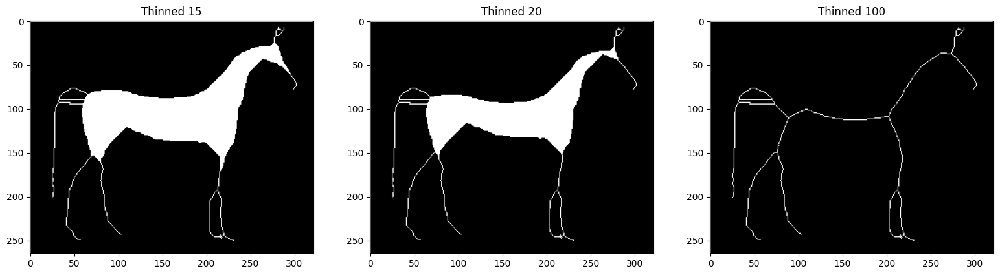

In [283]:
binImg= io.imread('horse.png', as_gray=True)

thinned_5 = thin(binImg, 5)
thinned_10 = thin(binImg, 10)
thinned_15 = thin(binImg, 15)
thinned_20 = thin(binImg, 20)
thinned_100 = thin(binImg, 100)

show_images([binImg,thinned_5,thinned_10],['Original','Thinned 5','Thinned 10'])
show_images([thinned_15,thinned_20,thinned_100],['Thinned 15','Thinned 20','Thinned 100'])

<div style="
  background-color: #e3f2fd;
  padding: 15px;
  border-left: 6px solid #0d47a1;
  border-radius: 8px;
  font-family: 'Georgia', serif;
  color: #01579b;
  font-size: 28px;
  text-align: center;
  font-weight: bold;
">
Noise & Filtering
</div>


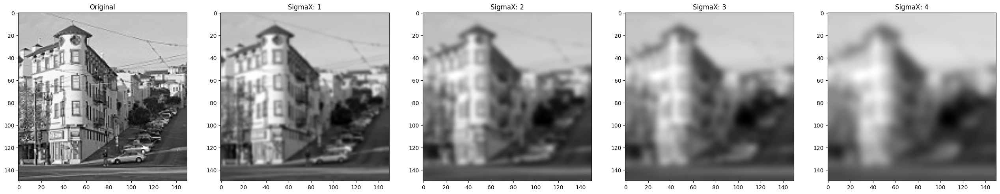

In [201]:
building = io.imread('building.jpg', as_gray=True)
images = [building]
titles = ['Original']   
for i in range(1, 5, 1):
    filtered = cv2.GaussianBlur(building,(0,0),sigmaX=i)
    images.append(filtered)
    titles.append('SigmaX: %d' % i)

show_images(images,titles)

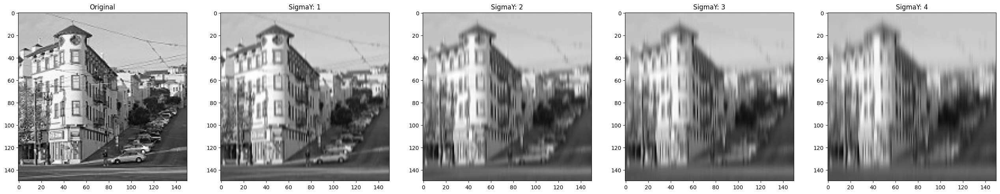

In [206]:
building = io.imread('building.jpg', as_gray=True)
images = [building]
titles = ['Original']   
for i in range(1, 5, 1):
    filtered = cv2.GaussianBlur(building,(0,0),sigmaX=0.00001,sigmaY=i)
    images.append(filtered)
    titles.append('SigmaY: %d' % i)

show_images(images,titles)

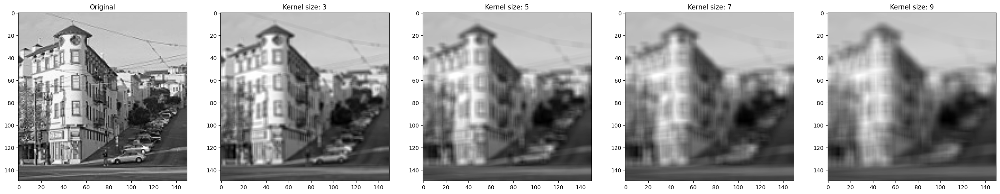

In [94]:
images = [building]
titles = ['Original']
for i in range(3, 11, 2):
    filtered = cv2.blur(building, (i,i))
    images.append(filtered)
    titles.append('Kernel size: %d' % i)

show_images(images,titles)

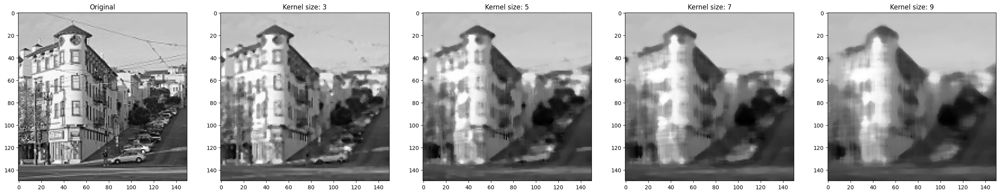

In [102]:
images=[building]
titles=['Original']
building = (building * 255).astype(np.uint8)

for i in range (3,11,2):
    filtered = cv2.medianBlur(building,i)
    images.append(filtered)
    titles.append('Kernel size: %d' %i)

show_images(images,titles)

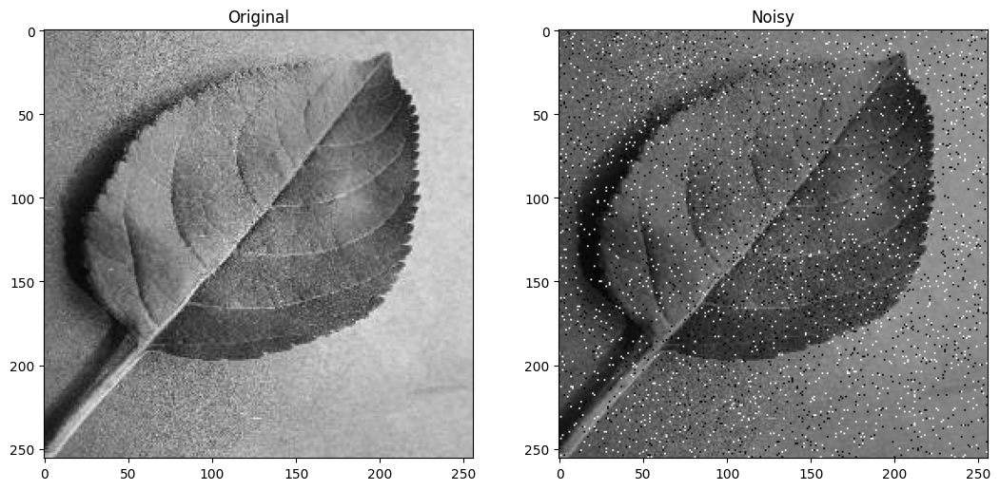

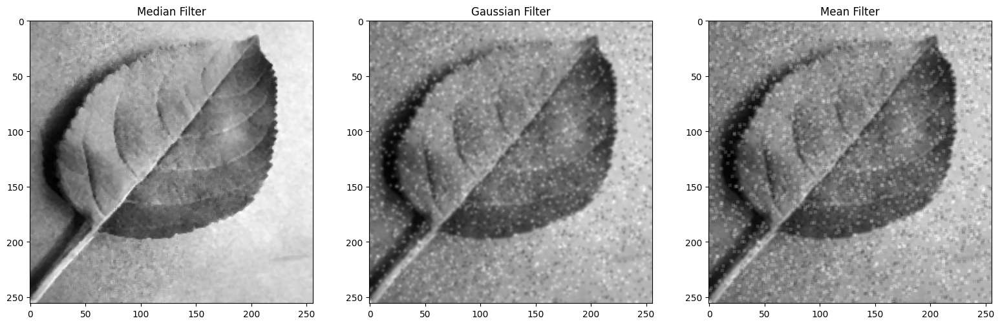

In [196]:
leaf = io.imread('leaf.png',as_gray=True)
leaf = (leaf * 255).astype(np.uint8)

leaf_noisy = random_noise(leaf, mode='s&p', amount=0.05)
leaf_noisy = (255*leaf_noisy).astype(np.uint8)

show_images([leaf,leaf_noisy],['Original','Noisy'])

leaf_denoised_median = cv2.medianBlur(leaf_noisy, 3)
leaf_denoised_gaussian = cv2.GaussianBlur(leaf_noisy, (0,0), 1)
leaf_denoised_mean = cv2.blur(leaf_noisy, (3,3))
show_images([leaf_denoised_median,leaf_denoised_gaussian,leaf_denoised_mean],['Median Filter','Gaussian Filter','Mean Filter'])

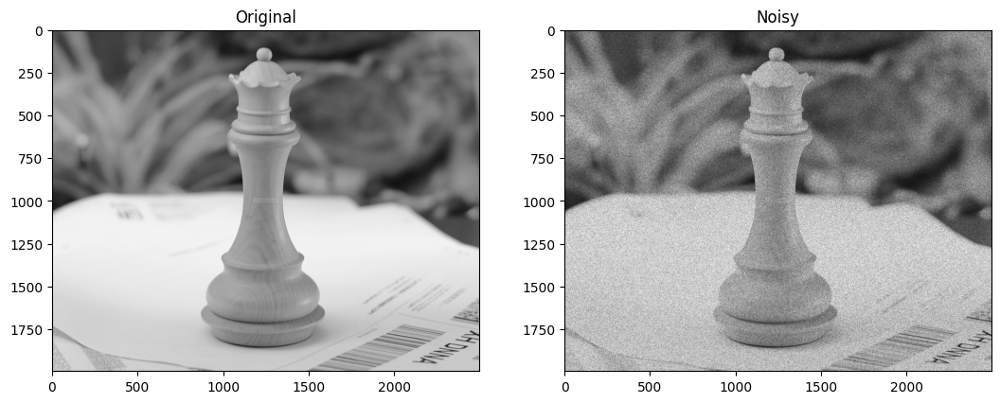

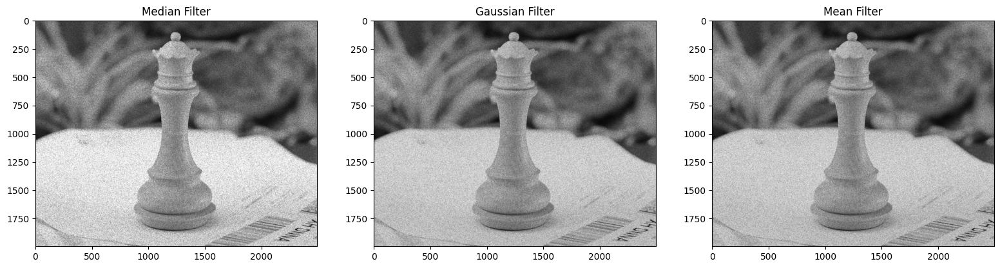

In [197]:
queen = io.imread('queen.jpg', as_gray=True)
queen = (queen * 255).astype(np.uint8)

queen_noisy = random_noise(queen, mode='speckle', var=0.2)
queen_noisy = (255*queen_noisy).astype(np.uint8)

show_images([queen,queen_noisy],['Original','Noisy'])

queen_denoised_median = cv2.medianBlur(queen_noisy, 3)
queen_denoised_gaussian = cv2.GaussianBlur(queen_noisy, (0,0), 1)
queen_denoised_mean = cv2.blur(queen_noisy, (3,3))
show_images([queen_denoised_median,queen_denoised_gaussian,queen_denoised_mean],['Median Filter','Gaussian Filter','Mean Filter'])

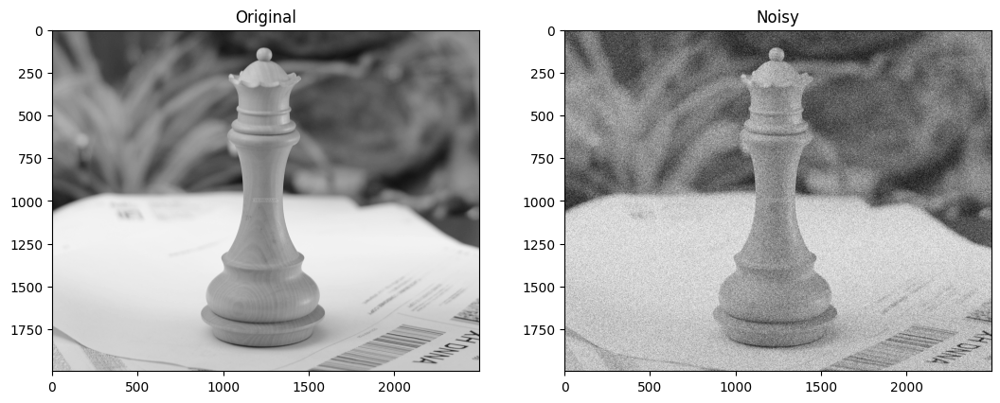

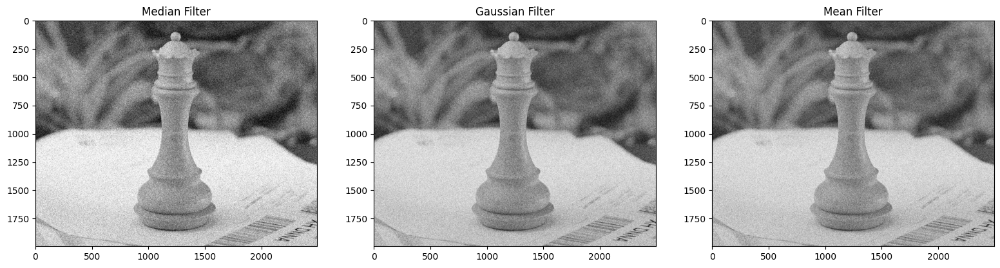

In [198]:
queen = io.imread('queen.jpg', as_gray=True)
queen = (queen * 255).astype(np.uint8)

queen_noisy = random_noise(queen, mode='gaussian', var=0.1)
queen_noisy = (255*queen_noisy).astype(np.uint8)

show_images([queen,queen_noisy],['Original','Noisy'])

queen_denoised_median = cv2.medianBlur(queen_noisy, 3)
queen_denoised_gaussian = cv2.GaussianBlur(queen_noisy, (0,0), 1)
queen_denoised_mean = cv2.blur(queen_noisy, (3,3))
show_images([queen_denoised_median,queen_denoised_gaussian,queen_denoised_mean],['Median Filter','Gaussian Filter','Mean Filter'])

<div style="
  background-color: #e3f2fd;
  padding: 15px;
  border-left: 6px solid #0d47a1;
  border-radius: 8px;
  font-family: 'Georgia', serif;
  color: #01579b;
  font-size: 28px;
  text-align: center;
  font-weight: bold;
">
Egde Detection
</div>


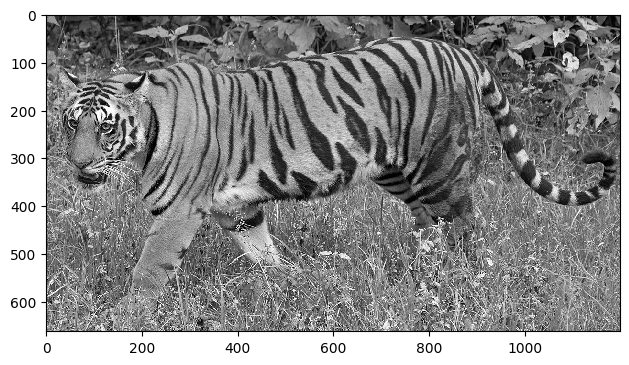

In [222]:
tiger=io.imread('tiger.jpg',as_gray=True)
io.imshow(tiger)

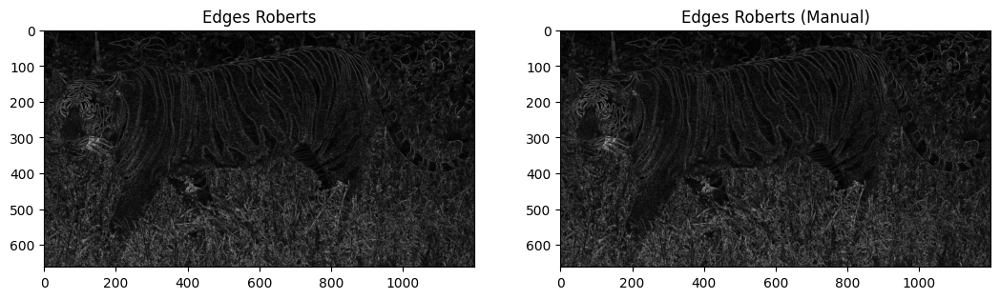

In [188]:
edges = roberts(tiger)
edges_manual = manual_roberts(tiger)
show_images([edges,edges_manual],['Edges Roberts','Edges Roberts (Manual)'])

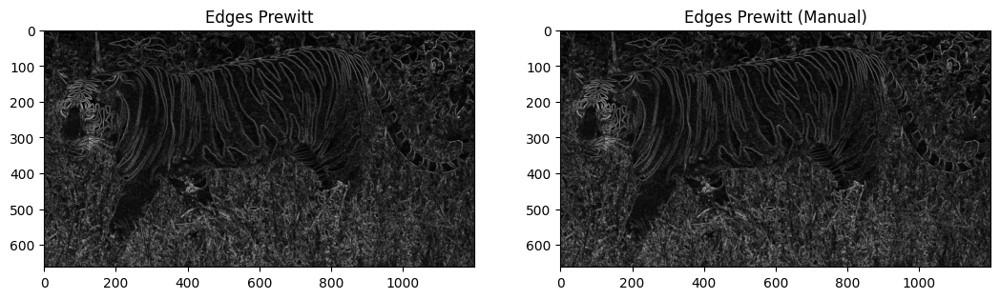

In [189]:
edges = prewitt(tiger)
edges_manual = manual_prewitt(tiger)
show_images([edges,edges_manual],['Edges Prewitt','Edges Prewitt (Manual)'])

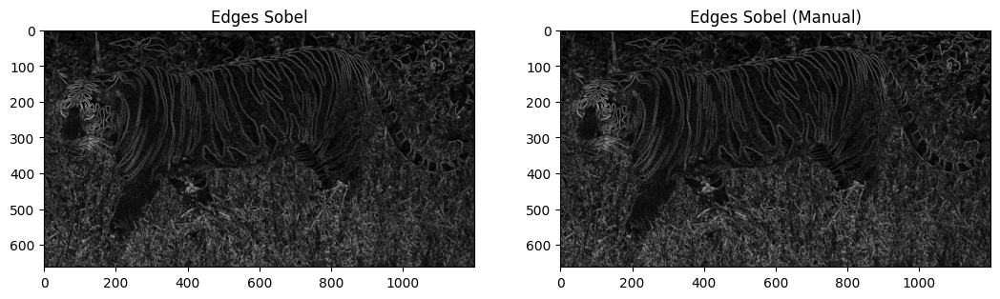

In [190]:
edges = sobel(tiger)
edges_manual = manual_sobel(tiger)

show_images([edges,edges_manual],['Edges Sobel','Edges Sobel (Manual)'])

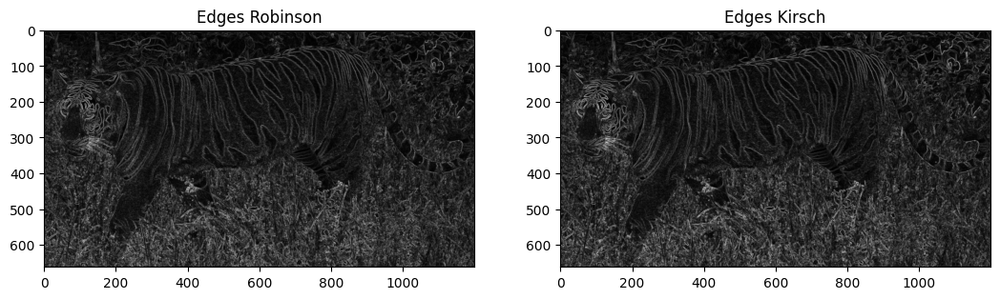

In [191]:
edges = manual_robinson(tiger)
edges2 = manual_kirsch(tiger)
show_images([edges,edges2],['Edges Robinson','Edges Kirsch'])

In [223]:
tiger = img_as_float(tiger)

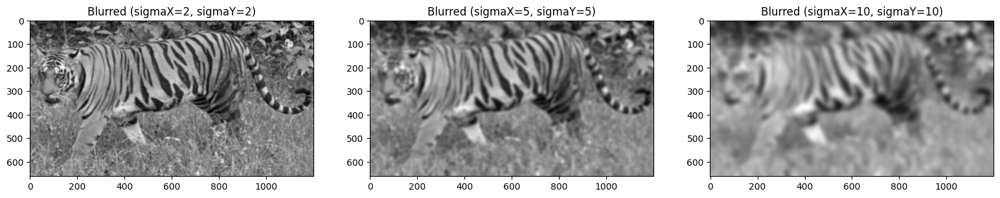

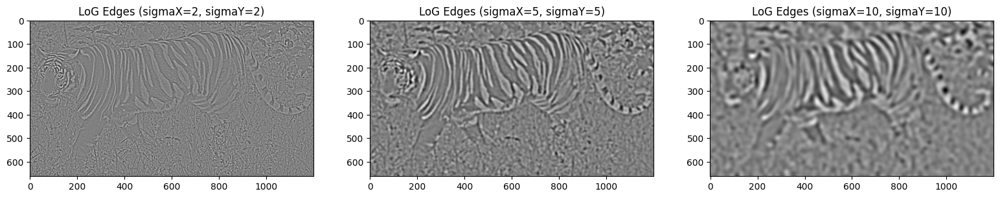

In [229]:

sigma_values = [(2, 2), (5, 5), (10, 10)]
blurred_images = []
log_edges_images = []

for sigmaX, sigmaY in sigma_values:
    blurred_image = cv2.GaussianBlur(tiger, (0, 0), sigmaX=sigmaX, sigmaY=sigmaY)
    log_edges = cv2.Laplacian(blurred_image, cv2.CV_64F)
    blurred_images.append(blurred_image)
    log_edges_images.append(log_edges)

show_images(blurred_images, [f'Blurred (sigmaX={sx}, sigmaY={sy})' for sx, sy in sigma_values])
show_images(log_edges_images, [f'LoG Edges (sigmaX={sx}, sigmaY={sy})' for sx, sy in sigma_values])


<div style="
  background-color: #e3f2fd;
  padding: 15px;
  border-left: 6px solid #0d47a1;
  border-radius: 8px;
  font-family: 'Georgia', serif;
  color: #01579b;
  font-size: 28px;
  text-align: center;
  font-weight: bold;
">
Colors
</div>

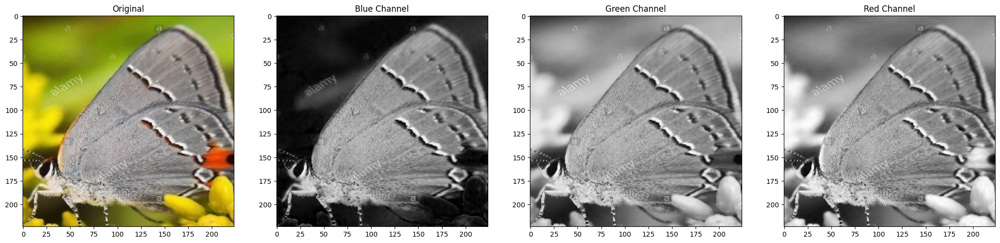

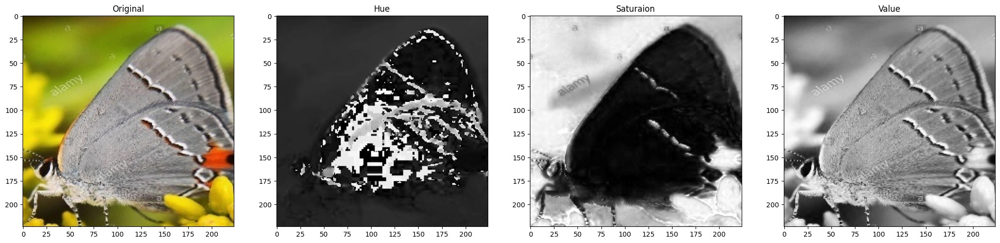

In [289]:
butterfly = io.imread('butterfly.jpg')
red_channel = butterfly[:, :, 0]
green_channel = butterfly[:, :, 1]
blue_channel = butterfly[:, :, 2]
show_images([butterfly,blue_channel, green_channel, red_channel], ['Original', 'Blue Channel', 'Green Channel', 'Red Channel'])

HSVimg=rgb2hsv(butterfly)
hue=HSVimg[:,:,0]
sat=HSVimg[:,:,1]
val=HSVimg[:,:,2]
show_images(images=[butterfly,hue,sat,val],titles=['Original','Hue','Saturaion','Value'])
